# Computer Vision
## Assignment 2

### Name: Shaurya Dewan
### Roll: 2019101017

### 2.

### 2.1

### Corner Detectors

In [61]:
import os
import cv2
import copy
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from PIL import Image

In [62]:
sobelX = np.array([[-1, 0, 1],
                   [-2, 0, 2],
                   [-1, 0, 1]
                 ])

sobelY = np.array([[1, 2, 1],
                   [0, 0, 0],
                   [-1, -2, -1]
                 ])

In [63]:
def gaussKern(side=3, sigma=1.):
    """\
    Creates gaussian kernel with side length `side` and a sigma of `sigma`
    """
    
    ax = np.linspace(-(side - 1) / 2., (side - 1) / 2., side)
    gauss = np.exp(-0.5 * np.square(ax) / np.square(sigma))
    kernel = np.outer(gauss, gauss)
    return kernel / np.sum(kernel)

def normalKern(side=3):
    return np.ones((side, side)) / side ** 2

In [4]:
def cornerDetect(img, method='harris', window=3, thresh=0.01, k=0.05, top=10000):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    Ix = signal.convolve2d(gray, sobelX, mode='same', boundary='symm')
    Iy = signal.convolve2d(gray, sobelY, mode='same', boundary='symm')
    
    Ixx = Ix ** 2
    Iyy = Iy ** 2
    Ixy = Ix * Iy
    cumIxx = signal.convolve2d(Ixx, normalKern(window), mode='same', boundary='symm')
    cumIyy = signal.convolve2d(Iyy, normalKern(window), mode='same', boundary='symm')
    cumIxy = signal.convolve2d(Ixy, normalKern(window), mode='same', boundary='symm')
    
    R = np.zeros(gray.shape)
    if method == 'harris':
        detH = cumIxx * cumIyy - cumIxy ** 2
        trH = cumIxx + cumIyy
        R = detH - k * trH ** 2
        
    elif method=='shi-tomasi':
        for i in range(gray.shape[0]):
            for j in range(gray.shape[1]):
                H = np.array([[cumIxx[i, j], cumIxy[i, j]],
                              [cumIxy[i, j], cumIyy[i, j]]])
                eigVals, v = np.linalg.eig(H)
                R[i, j] = np.min(eigVals)
        
    maxR = np.max(R)
    cornerImg = copy.deepcopy(img)
    corners = np.array(np.where(R / maxR > thresh))
    if method == 'shi-tomasi':
        R = R / maxR
        corners = np.c_[np.unravel_index(np.argpartition(R.ravel(), -top)[-top:], R.shape)].T

    for i in range(np.shape(corners)[1]):
        row = corners[0][i]
        col = corners[1][i]
        cornerImg[row, col, :] = [0, 0, 255]
    
    return cornerImg, corners.T

In [5]:
def cornerResDisp(imgPath, method='harris'):
    img = cv2.cvtColor(cv2.imread(imgPath), cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    imgPredCorners, predCorners = cornerDetect(img, method, thresh=0.005)
    imgGTCorners = copy.deepcopy(img)
    
    if method == 'harris':
        gtCorners = cv2.cornerHarris(gray, 3, 3, 0.05)
        gtCorners = cv2.dilate(gtCorners, None)
        imgGTCorners[gtCorners > 0.01 * gtCorners.max()] = [0, 0, 255]
        
    elif method == 'shi-tomasi':
        corners = cv2.goodFeaturesToTrack(gray, 100, 0.01, 10)
        corners = np.int0(corners)
        
        for i in corners:
            x, y = i.ravel()
            cv2.circle(imgGTCorners, (x, y), 3, [0, 0, 255], -1)
            
    fig = plt.figure(figsize=[20, 20])
    ax1 = fig.add_subplot(1, 3, 1)
    ax1.title.set_text('Original Image')
    plt.imshow(img)

    ax2 = fig.add_subplot(1, 3, 2)
    ax2.title.set_text('Predicted Corners (Implementation)')
    plt.imshow(imgPredCorners)

    ax3 = fig.add_subplot(1, 3, 3)
    ax3.title.set_text('Groundtruth Corners (Inbuilt)')
    plt.imshow(imgGTCorners)
    plt.show()

### (i) Harris Corner Detector

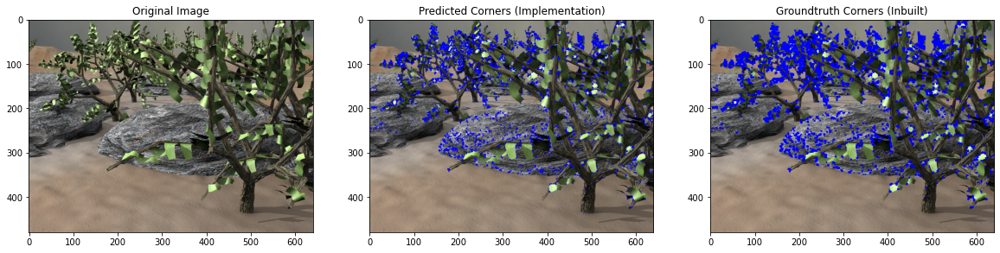

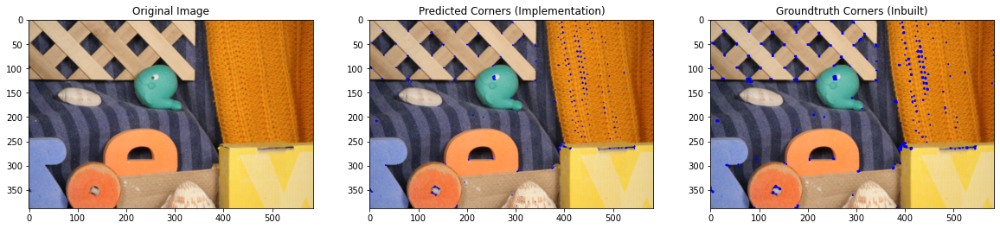

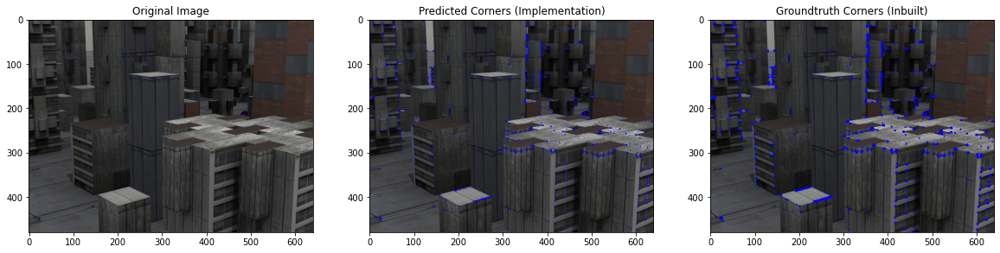

In [6]:
cornerResDisp('../data/all-frames-colour/Grove3/frame07.png')
cornerResDisp('../data/all-frames-colour/RubberWhale/frame07.png')
cornerResDisp('../data/all-frames-colour/Urban2/frame07.png')

### (ii) Shi-Tomasi Corner Detector

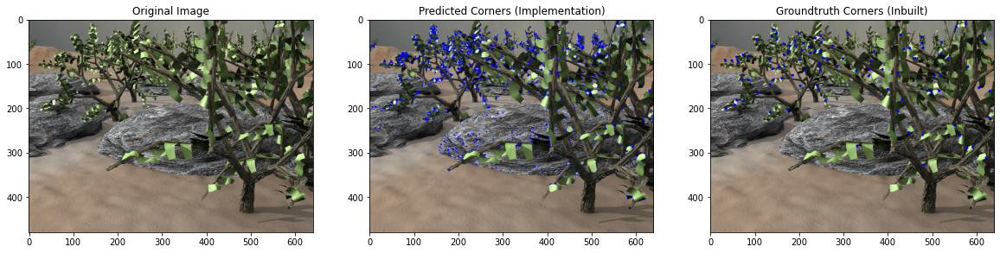

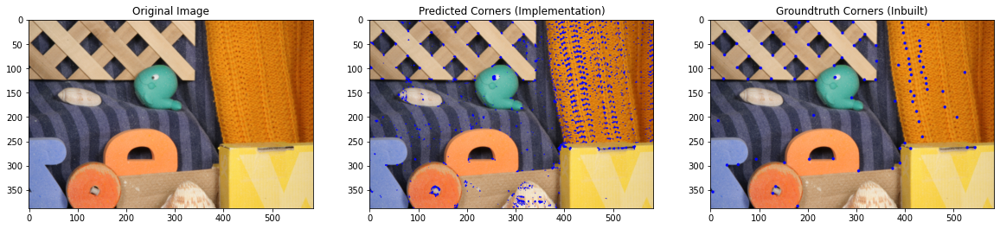

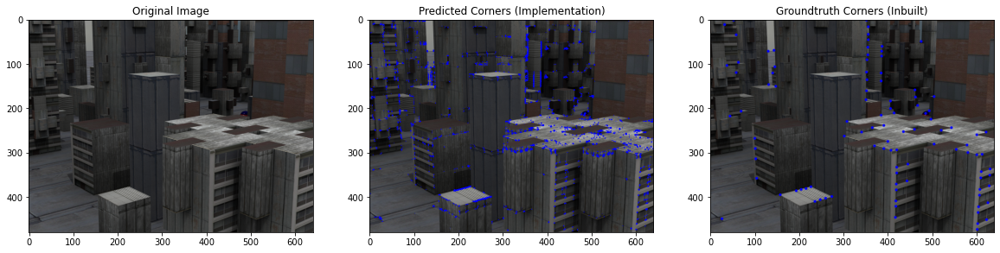

In [126]:
cornerResDisp('../data/all-frames-colour/Grove3/frame07.png', 'shi-tomasi')
cornerResDisp('../data/all-frames-colour/RubberWhale/frame07.png', 'shi-tomasi')
cornerResDisp('../data/all-frames-colour/Urban2/frame07.png', 'shi-tomasi')

### 2.2

### Single-Scale Lukas-Kanade Algorithm

In [7]:
def read_flow(filename):
    """
    read optical flow from Middlebury .flo file
    :param filename: name of the flow file
    :return: optical flow data in matrix
    """
    f = open(filename, 'rb')
    magic = np.fromfile(f, np.float32, count=1)
    data2d = None

    if 202021.25 != magic:
        print ('Magic number incorrect. Invalid .flo file')
    else:
        w = int(np.fromfile(f, np.int32, count=1)[0])
        h = int(np.fromfile(f, np.int32, count=1)[0])
        #print("Reading %d x %d flo file" % (h, w))
        data2d = np.fromfile(f, np.float32, count=2 * w * h)
        # reshape data into 3D array (columns, rows, channels)
        data2d = np.resize(data2d, (h, w, 2))
    f.close()
    return data2d

In [8]:
def make_color_wheel():
    """
    Generate color wheel according Middlebury color code
    :return: Color wheel
    """
    RY = 15
    YG = 6
    GC = 4
    CB = 11
    BM = 13
    MR = 6

    ncols = RY + YG + GC + CB + BM + MR

    colorwheel = np.zeros([ncols, 3])

    col = 0

    # RY
    colorwheel[0:RY, 0] = 255
    colorwheel[0:RY, 1] = np.transpose(np.floor(255*np.arange(0, RY) / RY))
    col += RY

    # YG
    colorwheel[col:col+YG, 0] = 255 - np.transpose(np.floor(255*np.arange(0, YG) / YG))
    colorwheel[col:col+YG, 1] = 255
    col += YG

    # GC
    colorwheel[col:col+GC, 1] = 255
    colorwheel[col:col+GC, 2] = np.transpose(np.floor(255*np.arange(0, GC) / GC))
    col += GC

    # CB
    colorwheel[col:col+CB, 1] = 255 - np.transpose(np.floor(255*np.arange(0, CB) / CB))
    colorwheel[col:col+CB, 2] = 255
    col += CB

    # BM
    colorwheel[col:col+BM, 2] = 255
    colorwheel[col:col+BM, 0] = np.transpose(np.floor(255*np.arange(0, BM) / BM))
    col += + BM

    # MR
    colorwheel[col:col+MR, 2] = 255 - np.transpose(np.floor(255 * np.arange(0, MR) / MR))
    colorwheel[col:col+MR, 0] = 255

    return colorwheel

In [9]:
def compute_color(u, v):
    """
    compute optical flow color map
    :param u: optical flow horizontal map
    :param v: optical flow vertical map
    :return: optical flow in color code
    """
    [h, w] = u.shape
    img = np.zeros([h, w, 3])
    nanIdx = np.isnan(u) | np.isnan(v)
    u[nanIdx] = 0
    v[nanIdx] = 0

    colorwheel = make_color_wheel()
    ncols = np.size(colorwheel, 0)

    rad = np.sqrt(u**2+v**2)

    a = np.arctan2(-v, -u) / np.pi

    fk = (a+1) / 2 * (ncols - 1) + 1

    k0 = np.floor(fk).astype(int)

    k1 = k0 + 1
    k1[k1 == ncols+1] = 1
    f = fk - k0

    for i in range(0, np.size(colorwheel,1)):
        tmp = colorwheel[:, i]
        col0 = tmp[k0-1] / 255
        col1 = tmp[k1-1] / 255
        col = (1-f) * col0 + f * col1

        idx = rad <= 1
        col[idx] = 1-rad[idx]*(1-col[idx])
        notidx = np.logical_not(idx)

        col[notidx] *= 0.75
        img[:, :, i] = np.uint8(np.floor(255 * col*(1-nanIdx)))

    return img

In [10]:
UNKNOWN_FLOW_THRESH = 1e7
def flow_to_image(flow):
    """
    Convert flow into middlebury color code image
    :param flow: optical flow map
    :return: optical flow image in middlebury color
    """
    u = flow[:, :, 0]
    v = flow[:, :, 1]

    maxu = -999.
    maxv = -999.
    minu = 999.
    minv = 999.

    idxUnknow = (abs(u) > UNKNOWN_FLOW_THRESH) | (abs(v) > UNKNOWN_FLOW_THRESH)
    u[idxUnknow] = 0
    v[idxUnknow] = 0

    maxu = max(maxu, np.max(u))
    minu = min(minu, np.min(u))

    maxv = max(maxv, np.max(v))
    minv = min(minv, np.min(v))

    rad = np.sqrt(u ** 2 + v ** 2)
    maxrad = max(-1, np.max(rad))

    u = u/(maxrad + np.finfo(float).eps)
    v = v/(maxrad + np.finfo(float).eps)

    img = compute_color(u, v)

    idx = np.repeat(idxUnknow[:, :, np.newaxis], 3, axis=2)
    img[idx] = 0

    return np.uint8(img)

In [94]:
def LukasKanadeForwardAdditive(img1, img2, windowSize=[5, 5], thresh=0.01):
    dx = signal.correlate2d(img1, sobelX, mode='same', boundary='symm')
    dy = signal.correlate2d(img1, sobelY, mode='same', boundary='symm')
    dxx = dx ** 2
    dyy = dy ** 2
    dxy = dx * dy
    dt = img2 - img1
    dxt = dx * dt
    dyt = dy * dt
    
    sumFil = np.ones((windowSize[1], windowSize[0]))
    dxxCum = signal.convolve2d(dxx, sumFil, mode='same', boundary='symm')
    dyyCum = signal.convolve2d(dyy, sumFil, mode='same', boundary='symm')
    dxyCum = signal.convolve2d(dxy, sumFil, mode='same', boundary='symm')
    dxtCum = signal.convolve2d(dxt, sumFil, mode='same', boundary='symm')
    dytCum = signal.convolve2d(dyt, sumFil, mode='same', boundary='symm')
    
    flow = np.zeros((img1.shape[0], img1.shape[1], 2))
    pts = []
    for i in range(img1.shape[0]):
        for j in range(img1.shape[1]):
            ATA = np.array([[dxxCum[i, j], dxyCum[i, j]],
                            [dxyCum[i, j], dyyCum[i, j]]])
            b = np.array([[-dxtCum[i, j]], [-dytCum[i, j]]])
            eigVals, v = np.linalg.eig(ATA)
            
            if np.min(eigVals) > thresh:
                flow[i, j, :] = (np.linalg.inv(ATA) @ b).T
                pts.append([i, j])
        
    return flow, pts

In [82]:
def normalize(img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    gray = (gray - np.mean(gray)) / 255
    return gray

In [145]:
def getErr(flow, gtFlow):
    epe = []
    for i in range(flow.shape[0]):
        for j in range(flow.shape[1]):
            epe.append(np.linalg.norm(gtFlow[i, j] - flow[i, j]))
            
    return np.mean(epe)

In [147]:
def optFlowDisp(seq, maxPts=1000):
    imgPath1 = '../data/all-frames-colour/%s/frame07.png' % (seq)
    imgPath2 = '../data/all-frames-colour/%s/frame08.png' % (seq)
    flowPath = '../data/ground-truth-flow/%s/flow10.flo' % (seq)
    
    gtFlow = read_flow(flowPath)
    gtFlowImg = flow_to_image(gtFlow)
    
    img1 = cv2.cvtColor(cv2.imread(imgPath1), cv2.COLOR_BGR2RGB)
    img2 = cv2.cvtColor(cv2.imread(imgPath2), cv2.COLOR_BGR2RGB)
    gray1 = normalize(img1)
    gray2 = normalize(img2)
    
    predFlow, flowPts =  LukasKanadeForwardAdditive(gray1, gray2, [15, 15], 0.0055)
    predFlowImg = flow_to_image(predFlow)
    
    cornerImg, corners = cornerDetect(img1, 'shi-tomasi', thresh=0.005, top=maxPts)
    fig = plt.figure(figsize=[20, 20])
    ax1 = fig.add_subplot(1, 3, 1)
    ax1.title.set_text('Predicted Quiver Plot')
    plt.imshow(img1)
    for i in range(np.shape(corners)[0]):
        row = corners[i][0]
        col = corners[i][1]
        plt.quiver(col, row, predFlow[row, col, 0], predFlow[row, col, 1], scale=4)
        
    ax2 = fig.add_subplot(1, 3, 2)
    ax2.title.set_text('Predicted Flow')
    plt.imshow(predFlowImg)
    
    ax3 = fig.add_subplot(1, 3, 3)
    ax3.title.set_text('Groundtruth Flow')
    plt.imshow(gtFlowImg)
    plt.show()
    
    print(getErr(predFlow, gtFlow))
    
    return predFlow, flowPts, corners

3.9171969895383296
1.1575177294946453
8.383556001130508


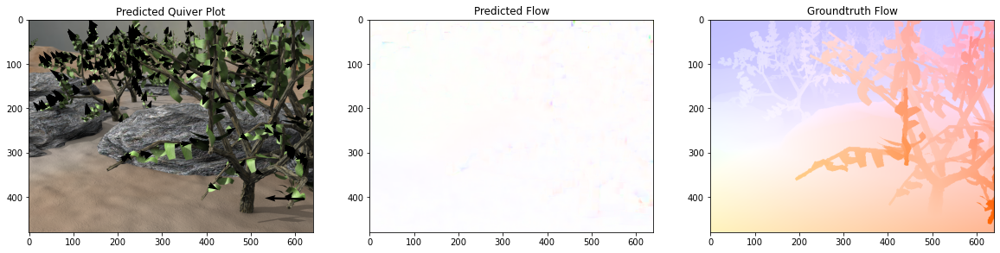

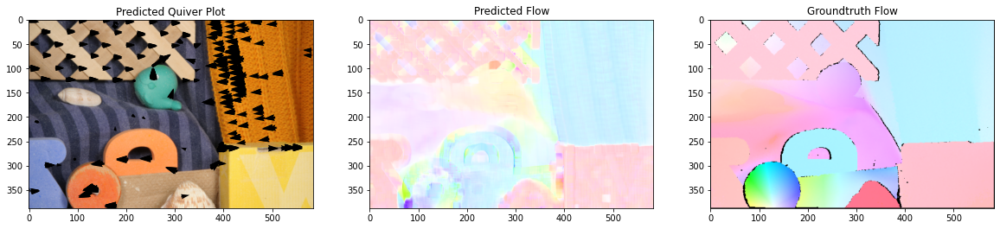

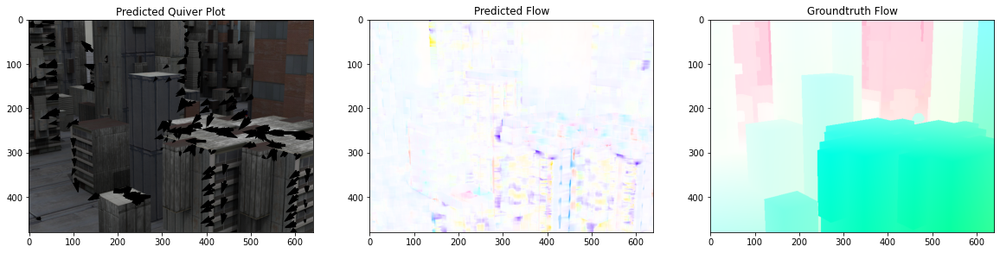

In [150]:
grove3 = optFlowDisp('Grove3')
rubberWhale = optFlowDisp('RubberWhale')
urban2 = optFlowDisp('Urban2')

In [85]:
def genFlowVid(seq):
    imgsDir = '../data/all-frames-colour/%s/' % (seq)
    files = sorted( filter( lambda x: os.path.isfile(os.path.join(imgsDir, x)),
                            os.listdir(imgsDir) ) )
    imgPaths = [imgsDir + file for file in files]
        
    flowPath = '../data/ground-truth-flow/%s/flow10.flo' % (seq)
    gtFlow = read_flow(flowPath)
    gtFlowImg = flow_to_image(gtFlow)
    
    for i in range(len(imgPaths) - 1):
        imgPath1 = imgPaths[i]
        imgPath2 = imgPaths[i + 1]
        img1 = cv2.cvtColor(cv2.imread(imgPath1), cv2.COLOR_BGR2RGB)
        img2 = cv2.cvtColor(cv2.imread(imgPath2), cv2.COLOR_BGR2RGB)
        gray1 = normalize(img1)
        gray2 = normalize(img2)
        
        predFlow, pts =  LukasKanadeForwardAdditive(gray1, gray2, [15, 15], 0.0055)
        predFlowImg = flow_to_image(predFlow)
        
        saveImg = Image.fromarray(predFlowImg)
        savePath = '../results/2.2/%s/%d.png' % (seq, i)
        saveImg.save(savePath)
        
        cornerImg, corners = cornerDetect(img1, 'shi-tomasi', thresh=0.005, top=1000)
        plt.figure()
        plt.imshow(img1)
        for j in range(np.shape(corners)[0]):
            row = corners[j][0]
            col = corners[j][1]
            plt.quiver(col, row, predFlow[row, col, 0], predFlow[row, col, 1], scale=5)
            
        quiverSavePath = '../results/2.2/%s/quiver%d.png' % (seq, i)
        plt.savefig(quiverSavePath)
        
    cmd = 'ffmpeg -r 1 -f image2 -s 1920x1080 -pattern_type glob -i "../results/2.2/%s/*.png" -vcodec libx264 -crf 25 -pix_fmt yuv420p ../results/2.2/%s/video.mp4' % (seq, seq)
    os.system(cmd)
    
    cmd = 'ffmpeg -r 1 -f image2 -s 1920x1080 -pattern_type glob -i "../results/2.2/%s/quiver*.png" -vcodec libx264 -crf 25 -pix_fmt yuv420p ../results/2.2/%s/quiverVideo.mp4' % (seq, seq)
    os.system(cmd)

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

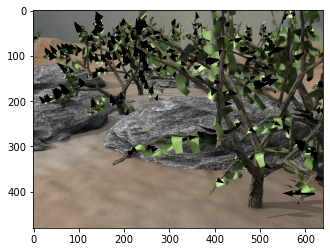

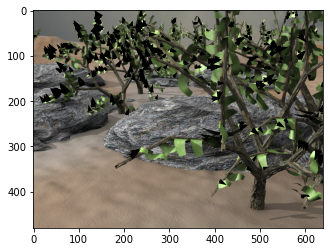

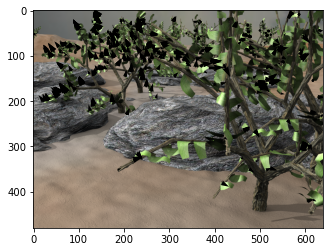

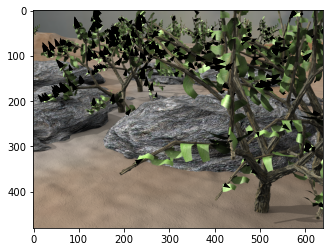

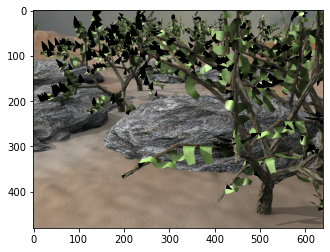

...

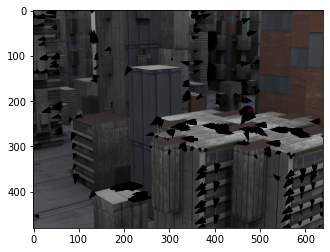

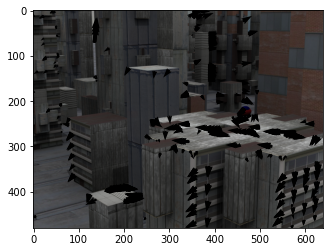

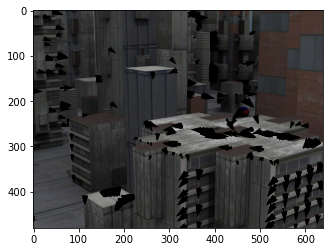

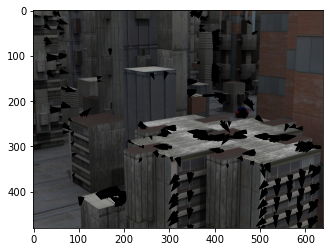

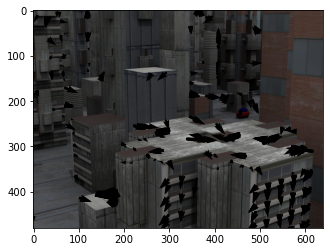

In [60]:
genFlowVid('Grove3')
genFlowVid('RubberWhale')
genFlowVid('Urban2')

### 3.

In [123]:
def OpticalFlowRefine(img1, img2, windowSize=[5, 5], u0=None, v0=None, thresh=0.01):
    optFlow = np.zeros((img1.shape[0], img1.shape[1], 2))
    if u0 is not None:
        optFlow[:, :, 0] = np.array(u0)
    if v0 is not None:
        optFlow[:, :, 1] = np.array(v0)    
    
    im2 = np.zeros(img2.shape)
    for r in range(img2.shape[0]):
        for c in range(img2.shape[1]):
            newR = r + round(optFlow[r, c, 1])            
            newC = c + round(optFlow[r, c, 0])
            
            if newR > img2.shape[0] - 1:
                newR = img2.shape[0] - 1
            elif newR < 0:
                newR = 0
                
            if newC > img2.shape[1] - 1:
                newC = img2.shape[1] - 1  
            elif newC < 0:
                newC = 0
                
            im2[r, c] = img2[newR, newC]
     
    flow, pts = LukasKanadeForwardAdditive(img1, im2, windowSize, thresh)
    return flow, pts

In [139]:
def MultiScaleLucasKanade(img1, img2, windowSize=[5, 5], numLvls=1, thresh=0.01):
    gray1 = normalize(img1)
    gray2 = normalize(img2)
    smooth1 = signal.convolve2d(gray1, gaussKern(5, 1), mode='same', boundary='symm')
    smooth2 = signal.convolve2d(gray2, gaussKern(5, 1), mode='same', boundary='symm')
    
    flow = None
    nextFlow = None
    pts = []
    for i in range(numLvls):
        skip = np.power(2, numLvls - i - 1)
        nextFlow = [None, None]
        
        if flow is not None:
            rows = gray1.shape[0] // skip + int((gray1.shape[0] % skip) > 0)
            cols = gray1.shape[1] // skip + int((gray1.shape[1] % skip) > 0)
            nextFlow[0] = np.zeros((rows, cols))
            nextFlow[1] = np.zeros((rows, cols))
            
            prevSkip = np.power(2, numLvls - i)
            nextFlow[0][::2, ::2] = flow[:, :, 0]
            nextFlow[1][::2, ::2] = flow[:, :, 1]
        
        flow, pts = OpticalFlowRefine(smooth1[::skip, ::skip], smooth2[::skip, ::skip], windowSize, nextFlow[0], nextFlow[1], thresh)
            
    return flow, pts

In [149]:
def optFlowDispOpt(seq, maxPts=1000):
    imgPath1 = '../data/all-frames-colour/%s/frame07.png' % (seq)
    imgPath2 = '../data/all-frames-colour/%s/frame08.png' % (seq)
    flowPath = '../data/ground-truth-flow/%s/flow10.flo' % (seq)
    
    gtFlow = read_flow(flowPath)
    gtFlowImg = flow_to_image(gtFlow)
    
    img1 = cv2.cvtColor(cv2.imread(imgPath1), cv2.COLOR_BGR2RGB)
    img2 = cv2.cvtColor(cv2.imread(imgPath2), cv2.COLOR_BGR2RGB)
    predFlow, flowPts =  MultiScaleLucasKanade(img1, img2, [15, 15], 4, 0.0055)
    predFlowImg = flow_to_image(predFlow)
    
    cornerImg, corners = cornerDetect(img1, 'shi-tomasi', thresh=0.005, top=maxPts)
    fig = plt.figure(figsize=[20, 20])
    ax1 = fig.add_subplot(1, 3, 1)
    ax1.title.set_text('Predicted Quiver Plot')
    plt.imshow(img1)
    for i in range(np.shape(corners)[0]):
        row = corners[i][0]
        col = corners[i][1]
        plt.quiver(col, row, predFlow[row, col, 0], predFlow[row, col, 1], scale=4)
        
    ax2 = fig.add_subplot(1, 3, 2)
    ax2.title.set_text('Predicted Flow')
    plt.imshow(predFlowImg)
    
    ax3 = fig.add_subplot(1, 3, 3)
    ax3.title.set_text('Groundtruth Flow')
    plt.imshow(gtFlowImg)
    plt.show()
    
    print(getErr(predFlow, gtFlow))
    
    return predFlow, flowPts, corners

3.910608550048352
1.1576240794350066
8.359131939546305


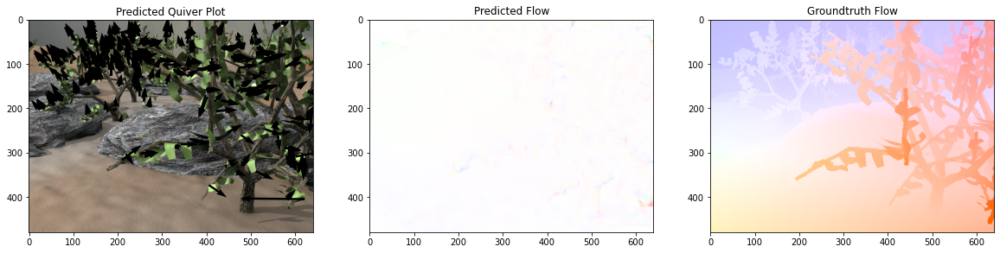

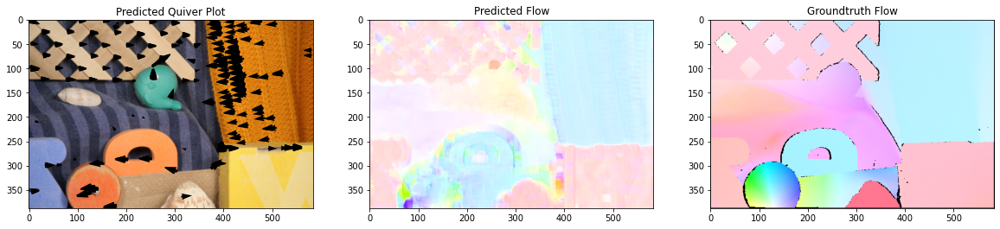

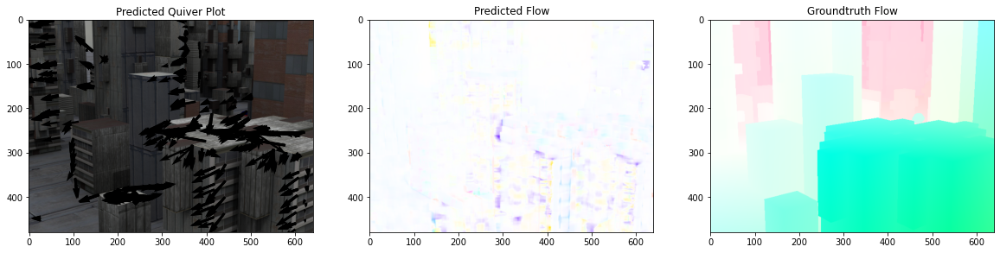

In [151]:
grove3Opt = optFlowDispOpt('Grove3')
rubberWhaleOpt = optFlowDispOpt('RubberWhale')
urban2Opt = optFlowDispOpt('Urban2')

In [152]:
def compare(seq, singleFlow, multiFlow, maxPts=1000):
    imgPath1 = '../data/all-frames-colour/%s/frame07.png' % (seq)
    img1 = cv2.cvtColor(cv2.imread(imgPath1), cv2.COLOR_BGR2RGB)
    cornerImg, corners = cornerDetect(img1, 'shi-tomasi', thresh=0.005, top=maxPts)
    fig = plt.figure(figsize=[20, 20])
    
    ax1 = fig.add_subplot(2, 2, 1)
    ax1.title.set_text('Single Scale Quiver Plot')
    plt.imshow(img1)
    for i in range(np.shape(corners)[0]):
        row = corners[i][0]
        col = corners[i][1]
        plt.quiver(col, row, singleFlow[row, col, 0], singleFlow[row, col, 1], scale=4)
        
    ax2 = fig.add_subplot(2, 2, 2)
    ax2.title.set_text('Multi Scale Quiver Plot')
    plt.imshow(img1)
    for i in range(np.shape(corners)[0]):
        row = corners[i][0]
        col = corners[i][1]
        plt.quiver(col, row, multiFlow[row, col, 0], multiFlow[row, col, 1], scale=4)
    
    singleImg = flow_to_image(singleFlow)
    ax3 = fig.add_subplot(2, 2, 3)
    ax3.title.set_text('Single Scale HSV')
    plt.imshow(singleImg)
    
    multiImg = flow_to_image(multiFlow)
    ax4 = fig.add_subplot(2, 2, 4)
    ax4.title.set_text('Multi Scale HSV')
    plt.imshow(multiImg)
    
    plt.show()

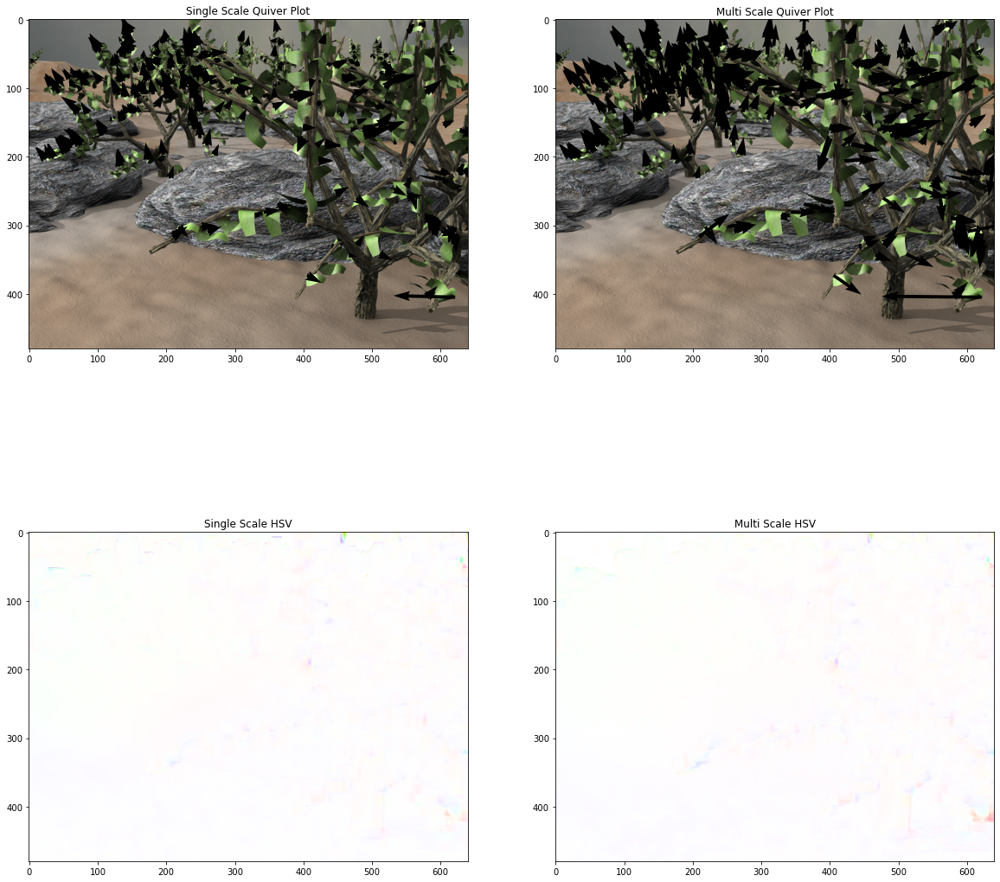

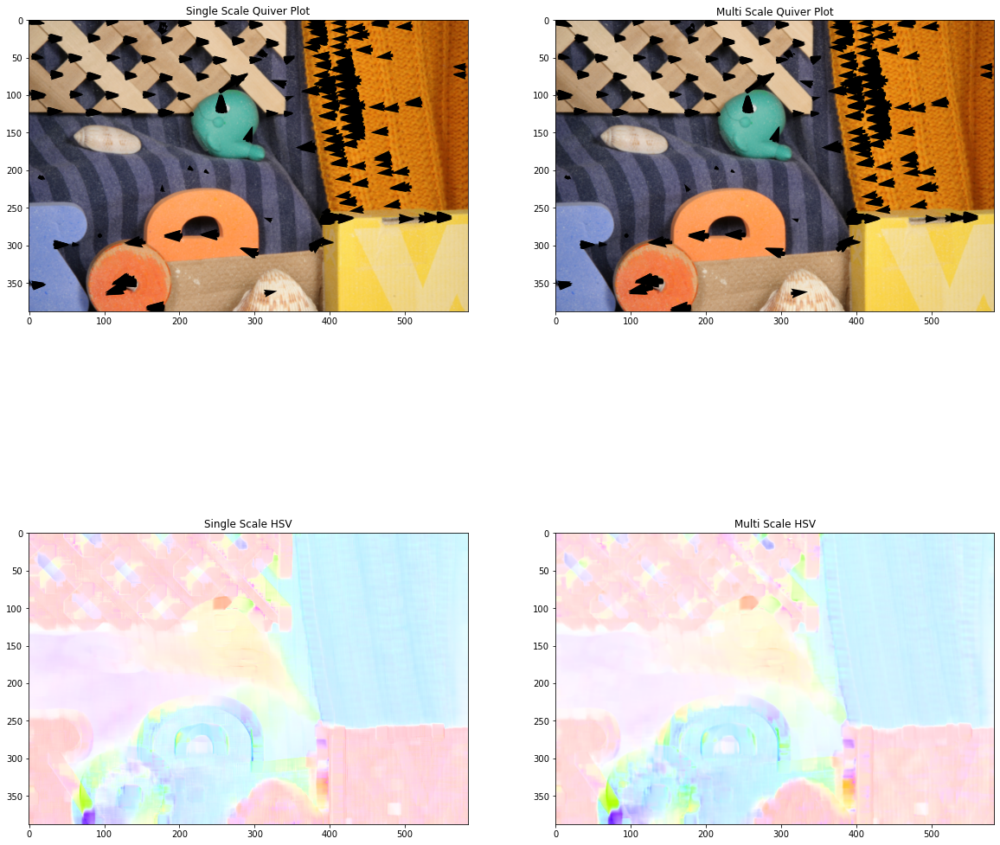

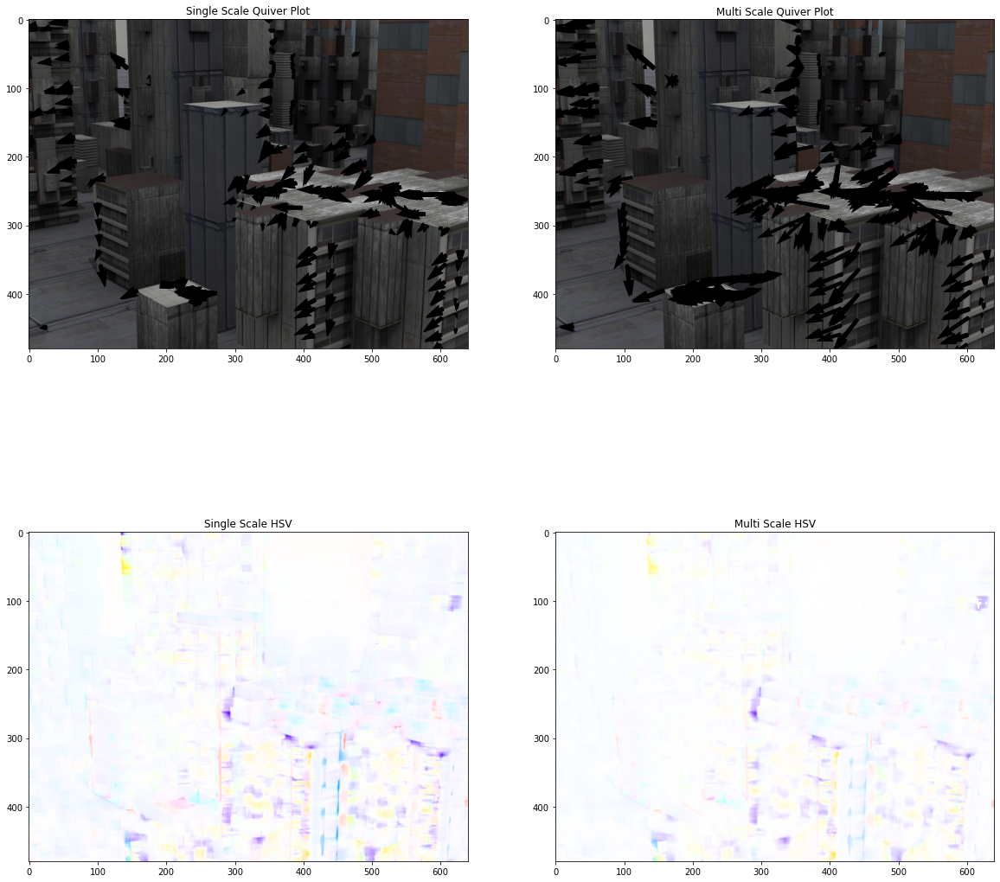

In [153]:
compare('Grove3', grove3[0], grove3Opt[0])
compare('RubberWhale', rubberWhale[0], rubberWhaleOpt[0])
compare('Urban2', urban2[0], urban2Opt[0])